# Customs X-ray Anomaly Detection with Convolutional Autoencoders

## Detección de anomalías en equipaje por rayos X

Este notebook inicia una práctica académica sobre **detección de anomalías visuales** usando Autoencoders Convolucionales. El caso de uso se plantea sobre imágenes de inspección de equipaje por rayos X, tomando como referencia el dataset **SIXray**.

El objetivo no es construir un detector definitivo de armas ni un clasificador de objetos prohibidos. El objetivo es estudiar una estrategia de apoyo a la decisión: aprender la apariencia de equipaje normal y utilizar el error de reconstrucción como señal de posible anomalía.


## 1. Introducción del problema

En inspección de seguridad, el sistema puede encontrarse con objetos conocidos, objetos modificados, combinaciones poco frecuentes o amenazas que no estaban presentes en el conjunto de entrenamiento. Esto convierte el problema en un escenario parcialmente abierto.

Un clasificador supervisado necesita ejemplos etiquetados de cada clase que se desea reconocer. Sin embargo, en detección de anomalías queremos formular otra pregunta: **¿esta imagen se parece a lo que el modelo aprendió como normal?**

Este enfoque es útil como línea base porque permite priorizar imágenes visualmente inusuales para revisión humana, sin afirmar que el modelo identifique de forma concluyente un objeto peligroso.


## 2. CNN supervisada vs detección de anomalías

Una **CNN supervisada** aprende una frontera entre clases conocidas. Su pregunta típica es:

> ¿Qué objeto conocido aparece en la imagen?

Un **Autoencoder para anomalías** aprende a reconstruir imágenes normales. Su pregunta es diferente:

> ¿Esta imagen encaja con la distribución visual de normalidad aprendida?

Durante el entrenamiento, el Autoencoder verá solo equipaje normal. En inferencia, una reconstrucción pobre puede producir un error alto. Ese error se usará más adelante como **score de anomalía**.

Limitación clave: si una anomalía es visualmente parecida al equipaje normal, el Autoencoder podría reconstruirla bien. Por eso el umbral y el análisis de falsos negativos serán partes críticas en fases posteriores.


## 3. Dataset: DvXray Negative Samples

Para esta versión del proyecto usaremos el dataset **DvXray_Negative_Samples**, formado por muestras negativas de equipaje por rayos X.

Este cambio encaja mejor con el enfoque de Autoencoders para detección de anomalías:

- El autoencoder debe aprender la apariencia de maletas normales.
- Por ahora no necesitamos objetos prohibidos para entrenar.
- Las muestras positivas/anómalas se incorporarán más adelante para test y evaluación.

La estructura local detectada es:

- `DvXray_Negative_Samples/`
- Archivos `.json` con metadatos por muestra.
- Imágenes `.png` con dos variantes por muestra:
  - `_OL.png`
  - `_SD.png`

Todos los ejemplos de esta carpeta se tratarán como normales:

```text
is_anomaly = 0
num_objects = 0
```

Este notebook mantiene el framing académico: no estamos construyendo un detector definitivo de amenazas, sino una línea base que aprende normalidad visual para después medir desviaciones por error de reconstrucción.


## 4. Objetivo del notebook

Este notebook se construirá por fases. En esta primera fase solo dejaremos preparada la base conceptual y técnica.

Objetivos de esta fase:

- Definir el framing académico del proyecto.
- Preparar imports iniciales.
- Fijar semilla para reproducibilidad.
- Detectar si se usará CPU o GPU.
- Definir rutas principales y variables globales.
- Preparar una fase mínima de configuración del dataset.

No se implementan todavía carga completa del dataset, `DataLoader`, `transforms`, modelo ni entrenamiento.


## 5. Imports iniciales

Importamos solo librerías base para configuración, reproducibilidad y preparación del entorno. Las librerías específicas de carga de datos, visualización avanzada y entrenamiento se incorporarán cuando sean necesarias.


In [38]:
from pathlib import Path
import os
import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, UnidentifiedImageError
import yaml
import torch


## 6. Configuración base

Centralizamos las variables principales para que el notebook sea fácil de modificar. En fases posteriores, estas variables permitirán controlar la carga de datos, el tamaño de imagen, la creación de subconjuntos y las carpetas de salida.


In [39]:
SEED = 42
PROJECT_NAME = "Customs X-ray Anomaly Detection with Convolutional Autoencoders"

IMAGE_SIZE = 128
BATCH_SIZE = 32
VALIDATION_SIZE = 0.2
TEST_NORMAL_SIZE = 0.25
THRESHOLD_QUANTILE = 0.95


### Reproducibilidad

Fijamos semillas para reducir variabilidad entre ejecuciones. En GPU, algunas operaciones pueden seguir teniendo pequeñas diferencias según hardware y versiones de librerías, pero esta configuración deja una base reproducible razonable para la práctica.


In [40]:
def set_seed(seed: int = 42) -> None:
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


set_seed(SEED)
print(f"Seed fijada: {SEED}")


Seed fijada: 42


### Dispositivo de ejecución

Si hay GPU disponible, PyTorch la usará automáticamente. Si no, el notebook continuará en CPU. Para una primera iteración con subconjunto, CPU puede ser suficiente aunque más lenta.


In [41]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Dispositivo seleccionado: {DEVICE}")


Dispositivo seleccionado: cuda


## Fase 0.5 — Preparación del dataset

El dataset actual está en `DvXray_Negative_Samples/` y contiene únicamente muestras negativas. Esto es ideal para el entrenamiento inicial del autoencoder, porque el modelo debe aprender a reconstruir equipaje normal.

Cada muestra tiene un identificador como `N00000` y suele incluir:

- `N00000.json`: metadatos de la muestra.
- `N00000_OL.png`: imagen variante OL.
- `N00000_SD.png`: imagen variante SD.

Por defecto usaremos ambas variantes (`IMAGE_VARIANT = "both"`) para aprovechar todas las imágenes normales disponibles. Si se quiere entrenar solo con una variante, se puede cambiar a `"OL"` o `"SD"`.


In [42]:
DATA_ROOT = Path("DvXray_Negative_Samples")
OUTPUT_DIR = Path("outputs")

IMAGE_VARIANT = "both"  # opciones: "both", "OL", "SD"
USE_SUBSET = False
MAX_NORMAL_SAMPLES = None
MAX_ANOMALY_SAMPLES = 0

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print(f"DATA_ROOT: {DATA_ROOT.resolve()}")
print(f"OUTPUT_DIR: {OUTPUT_DIR}")
print(f"IMAGE_VARIANT: {IMAGE_VARIANT}")
print(f"USE_SUBSET: {USE_SUBSET}")


DATA_ROOT: C:\Users\adnan\Desktop\tajamar-genai-tasks\09-AutoEncoders\DvXray_Negative_Samples
OUTPUT_DIR: outputs
IMAGE_VARIANT: both
USE_SUBSET: False


## Fase 2 — Preparación y verificación del dataset

Antes de entrenar, verificamos que la carpeta existe y que la estructura de archivos es coherente.

A diferencia de la exportación YOLO anterior, aquí no hay labels de detección. La propia carpeta representa el conjunto negativo:

- Si una imagen aparece en `DvXray_Negative_Samples/`, se considera normal.
- `is_anomaly = 0`.
- `num_objects = 0`.
- `original_classes = []`.

Esto prepara el escenario correcto para anomaly detection: entrenar con normalidad y reservar las anomalías para una fase posterior de evaluación.


### Flujo detallado de esta fase

1. Comprobar que existe `DvXray_Negative_Samples/`.
2. Contar imágenes `.png`.
3. Contar metadatos `.json`.
4. Separar imágenes por variante: `OL` y `SD`.
5. Asociar cada imagen con su JSON correspondiente.
6. Leer los metadatos básicos.
7. Construir `df_images`.
8. Validar imágenes corruptas con PIL.
9. Mostrar tablas de resumen.
10. Mostrar una primera vista visual de muestras normales.


### 2.1 Verificación de estructura

Comprobamos la carpeta raíz, el número de imágenes y el número de archivos de metadatos.


In [43]:
IMAGE_EXTENSIONS = {".png", ".jpg", ".jpeg"}

data_root_exists = DATA_ROOT.exists()
all_image_paths = sorted(
    path for path in DATA_ROOT.glob("*")
    if path.suffix.lower() in IMAGE_EXTENSIONS
) if data_root_exists else []
metadata_paths = sorted(DATA_ROOT.glob("*.json")) if data_root_exists else []

ol_paths = [path for path in all_image_paths if path.stem.endswith("_OL")]
sd_paths = [path for path in all_image_paths if path.stem.endswith("_SD")]

print(f"Existe DATA_ROOT: {data_root_exists}")
print(f"Total de imágenes encontradas: {len(all_image_paths)}")
print(f"Imágenes OL: {len(ol_paths)}")
print(f"Imágenes SD: {len(sd_paths)}")
print(f"Archivos JSON: {len(metadata_paths)}")

if not data_root_exists:
    print("Revisa la ruta DATA_ROOT. No se encontró la carpeta del dataset.")


Existe DATA_ROOT: True
Total de imágenes encontradas: 22000
Imágenes OL: 11000
Imágenes SD: 11000
Archivos JSON: 11000


## Fase 3 — Carga del dataset y construcción del DataFrame

Construimos `df_negative`, una tabla con una fila por imagen individual del dataset negativo.

DvXray es un dataset **dual-view**: cada muestra suele tener dos vistas de la misma maleta. En esta primera línea base trabajaremos con imágenes individuales, porque un autoencoder simple recibe una imagen y aprende a reconstruirla. La segunda vista queda preparada como mejora futura para un enfoque **multi-view**, donde el modelo podría usar ambas perspectivas de la misma muestra.

Por ahora todas las imágenes cargadas son normales:

```text
is_anomaly = 0
```

Más adelante añadiremos muestras positivas únicamente para test y evaluación.


### 3.1 Extracción robusta de identificadores

Cada archivo sigue un patrón como:

```text
N00000_OL.png
N00000_SD.png
```

De ahí extraemos:

- `sample_id`: identificador común de la maleta, por ejemplo `N00000`.
- `view_id`: vista de la imagen, por ejemplo `OL` o `SD`.

Si el nombre no sigue exactamente ese patrón, el código intenta apoyarse en el metadata JSON cuando sea posible.


In [44]:
import json


SOURCE_DATASET = "DvXray_Negative_Samples"


def read_metadata(metadata_path: Path) -> dict:
    if not metadata_path.exists():
        return {}
    try:
        return json.loads(metadata_path.read_text(encoding="utf-8"))
    except json.JSONDecodeError:
        return {"metadata_error": "json_decode_error"}


def parse_sample_and_view(image_path: Path, metadata: dict | None = None) -> tuple[str, str]:
    stem = image_path.stem
    parts = stem.rsplit("_", 1)

    if len(parts) == 2 and parts[1] in {"OL", "SD"}:
        return parts[0], parts[1]

    metadata = metadata or {}
    metadata_name = metadata.get("name")
    if metadata_name:
        return str(metadata_name), "unknown"

    return stem, "unknown"


def collect_negative_images(data_root: Path, image_variant: str = "both") -> list[Path]:
    image_paths = sorted(
        path
        for path in data_root.glob("*")
        if path.suffix.lower() in IMAGE_EXTENSIONS
    )

    variant = image_variant.lower()
    if variant == "both":
        return image_paths
    if variant == "ol":
        return [path for path in image_paths if path.stem.endswith("_OL")]
    if variant == "sd":
        return [path for path in image_paths if path.stem.endswith("_SD")]

    raise ValueError("IMAGE_VARIANT debe ser 'both', 'OL' o 'SD'.")


### 3.2 Construcción de `df_negative`

Cada fila representa una imagen normal individual. La columna `source_dataset` permite mantener trazabilidad si más adelante combinamos negativos y positivos de distintas fuentes.


In [45]:
selected_image_paths = collect_negative_images(DATA_ROOT, IMAGE_VARIANT)

records = []
for image_path in selected_image_paths:
    provisional_sample_id = image_path.stem.rsplit("_", 1)[0]
    metadata_path = DATA_ROOT / f"{provisional_sample_id}.json"
    metadata = read_metadata(metadata_path)
    sample_id, view_id = parse_sample_and_view(image_path, metadata)

    metadata_path = DATA_ROOT / f"{sample_id}.json"

    records.append({
        "image_path": image_path,
        "metadata_path": metadata_path,
        "sample_id": sample_id,
        "view_id": view_id,
        "is_anomaly": 0,
        "source_dataset": SOURCE_DATASET,
    })


df_negative = pd.DataFrame.from_records(records)

print(f"Shape de df_negative: {df_negative.shape}")
display(df_negative.head())


Shape de df_negative: (22000, 6)


,image_path,metadata_path,sample_id,view_id,is_anomaly,source_dataset
0,DvXray_Negative_Samples\N00000_OL.png,DvXray_Negative_Samples\N00000.json,N00000,OL,0,DvXray_Negative_Samples
1,DvXray_Negative_Samples\N00000_SD.png,DvXray_Negative_Samples\N00000.json,N00000,SD,0,DvXray_Negative_Samples
2,DvXray_Negative_Samples\N00001_OL.png,DvXray_Negative_Samples\N00001.json,N00001,OL,0,DvXray_Negative_Samples
3,DvXray_Negative_Samples\N00001_SD.png,DvXray_Negative_Samples\N00001.json,N00001,SD,0,DvXray_Negative_Samples
4,DvXray_Negative_Samples\N00002_OL.png,DvXray_Negative_Samples\N00002.json,N00002,OL,0,DvXray_Negative_Samples


### 3.3 Validación de vistas por muestra

Como DvXray es dual-view, esperamos que cada `sample_id` tenga dos vistas. En esta fase no eliminamos nada: solo diagnosticamos si hay muestras incompletas.


In [46]:
if df_negative.empty:
    print("df_negative está vacío. No hay vistas que validar.")
    view_distribution = pd.Series(dtype=int)
    incomplete_views = pd.DataFrame()
else:
    print(f"Número de sample_id únicos: {df_negative['sample_id'].nunique()}")

    print("Distribución de view_id:")
    view_distribution = df_negative["view_id"].value_counts()
    display(view_distribution.rename_axis("view_id").reset_index(name="num_images"))

    sample_view_summary = (
        df_negative.groupby("sample_id")["view_id"]
        .agg(lambda values: sorted(set(values)))
        .reset_index(name="views_found")
    )
    sample_view_summary["num_views_found"] = sample_view_summary["views_found"].apply(len)
    sample_view_summary["has_expected_dual_view"] = sample_view_summary["views_found"].apply(
        lambda views: set(views) == {"OL", "SD"}
    )

    incomplete_views = sample_view_summary[~sample_view_summary["has_expected_dual_view"]]

    print(f"Muestras con vistas completas OL+SD: {int(sample_view_summary['has_expected_dual_view'].sum())}")
    print(f"Muestras con vistas incompletas o inesperadas: {len(incomplete_views)}")

    if not incomplete_views.empty:
        display(incomplete_views.head(20))
    else:
        print("No se han detectado muestras con vistas incompletas.")


Número de sample_id únicos: 11000
Distribución de view_id:


,view_id,num_images
0,OL,11000
1,SD,11000


Muestras con vistas completas OL+SD: 11000
Muestras con vistas incompletas o inesperadas: 0
No se han detectado muestras con vistas incompletas.


### 3.4 Resumen de carga

Este resumen confirma que el DataFrame representa el conjunto negativo que usaremos como base para aprender normalidad.


In [47]:
if df_negative.empty:
    print("df_negative está vacío. No hay resumen que mostrar.")
else:
    print(f"Shape del DataFrame: {df_negative.shape}")
    print(f"Número de sample_id únicos: {df_negative['sample_id'].nunique()}")
    print(f"Total de imágenes normales: {len(df_negative)}")
    print(f"Total de anomalías en este dataset: {int(df_negative['is_anomaly'].sum())}")
    print()

    print("Distribución de view_id:")
    display(df_negative["view_id"].value_counts().rename_axis("view_id").reset_index(name="num_images"))

    print("Ejemplos de filas:")
    display(df_negative.sample(n=min(10, len(df_negative)), random_state=SEED))


Shape del DataFrame: (22000, 6)
Número de sample_id únicos: 11000
Total de imágenes normales: 22000
Total de anomalías en este dataset: 0

Distribución de view_id:


,view_id,num_images
0,OL,11000
1,SD,11000


Ejemplos de filas:


,image_path,metadata_path,sample_id,view_id,is_anomaly,source_dataset
13035,DvXray_Negative_Samples\N06517_SD.png,DvXray_Negative_Samples\N06517.json,N06517,SD,0,DvXray_Negative_Samples
3115,DvXray_Negative_Samples\N01557_SD.png,DvXray_Negative_Samples\N01557.json,N01557,SD,0,DvXray_Negative_Samples
8732,DvXray_Negative_Samples\N04366_OL.png,DvXray_Negative_Samples\N04366.json,N04366,OL,0,DvXray_Negative_Samples
7591,DvXray_Negative_Samples\N03795_SD.png,DvXray_Negative_Samples\N03795.json,N03795,SD,0,DvXray_Negative_Samples
221,DvXray_Negative_Samples\N00110_SD.png,DvXray_Negative_Samples\N00110.json,N00110,SD,0,DvXray_Negative_Samples
17295,DvXray_Negative_Samples\N08647_SD.png,DvXray_Negative_Samples\N08647.json,N08647,SD,0,DvXray_Negative_Samples
5857,DvXray_Negative_Samples\N02928_SD.png,DvXray_Negative_Samples\N02928.json,N02928,SD,0,DvXray_Negative_Samples
12608,DvXray_Negative_Samples\N06304_OL.png,DvXray_Negative_Samples\N06304.json,N06304,OL,0,DvXray_Negative_Samples
3463,DvXray_Negative_Samples\N01731_SD.png,DvXray_Negative_Samples\N01731.json,N01731,SD,0,DvXray_Negative_Samples
6478,DvXray_Negative_Samples\N03239_OL.png,DvXray_Negative_Samples\N03239.json,N03239,OL,0,DvXray_Negative_Samples


## Fase 4 — Exploración visual inicial

La práctica debe ser visual: antes de entrenar nada, miramos el dataset.

En esta fase mostramos:

- Imágenes normales aleatorias.
- Pares dual-view cuando existen ambas vistas de una misma muestra.

Seguimos sin implementar positivos, splits definitivos, preprocessing, `Dataset`, `DataLoader`, modelo ni entrenamiento.


### 4.1 Función `plot_random_images`

Esta función muestra imágenes normales aleatorias tratadas de forma individual. Es la vista que más se parece al baseline inicial del autoencoder.


In [48]:
def plot_random_images(df: pd.DataFrame, n: int = 12) -> None:
    if df.empty:
        print("No hay imágenes para visualizar.")
        return

    sample_df = df.sample(n=min(n, len(df)), random_state=SEED)
    cols = 4
    rows = int(np.ceil(len(sample_df) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(14, 3.4 * rows))
    axes = np.array(axes).reshape(-1)

    for ax, (_, row) in zip(axes, sample_df.iterrows()):
        image = Image.open(row["image_path"]).convert("RGB")
        ax.imshow(image)
        ax.set_title(f"{row['sample_id']} | {row['view_id']} | normal")
        ax.axis("off")

    for ax in axes[len(sample_df):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()


### 4.2 Función `plot_dual_view_samples`

Esta función muestra pares de vistas de la misma muestra. El baseline inicial usará imágenes individuales, pero esta vista deja clara una posible mejora futura: modelos multi-view que aprovechen ambas perspectivas.


In [49]:
def plot_dual_view_samples(df: pd.DataFrame, n: int = 5) -> None:
    if df.empty:
        print("No hay imágenes para visualizar.")
        return

    paired_ids = (
        df.groupby("sample_id")["view_id"]
        .agg(lambda values: set(values))
        .loc[lambda series: series.apply(lambda views: {"OL", "SD"}.issubset(views))]
        .index
        .tolist()
    )

    if not paired_ids:
        print("No se encontraron muestras con pares OL+SD.")
        return

    rng = np.random.default_rng(SEED)
    selected_ids = rng.choice(paired_ids, size=min(n, len(paired_ids)), replace=False)

    fig, axes = plt.subplots(len(selected_ids), 2, figsize=(9, 3.4 * len(selected_ids)))
    if len(selected_ids) == 1:
        axes = np.expand_dims(axes, axis=0)

    for row_idx, sample_id in enumerate(selected_ids):
        sample_df = df[df["sample_id"] == sample_id]

        for col_idx, view_id in enumerate(["OL", "SD"]):
            ax = axes[row_idx, col_idx]
            view_rows = sample_df[sample_df["view_id"] == view_id]
            if view_rows.empty:
                ax.text(0.5, 0.5, f"Vista {view_id} no disponible", ha="center", va="center")
                ax.axis("off")
                continue

            image_path = view_rows.iloc[0]["image_path"]
            image = Image.open(image_path).convert("RGB")
            ax.imshow(image)
            ax.set_title(f"{sample_id} | view {view_id}")
            ax.axis("off")

    plt.tight_layout()
    plt.show()


### 4.3 Visualización rápida

Primero vemos imágenes normales individuales; después, pares dual-view.


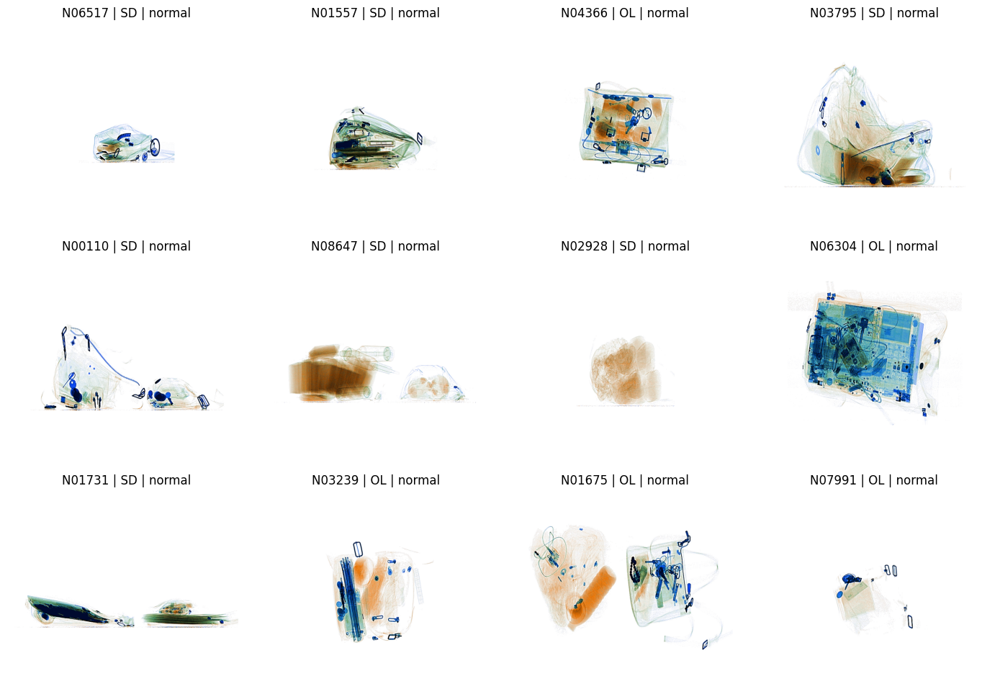

In [50]:
plot_random_images(df_negative, n=12)


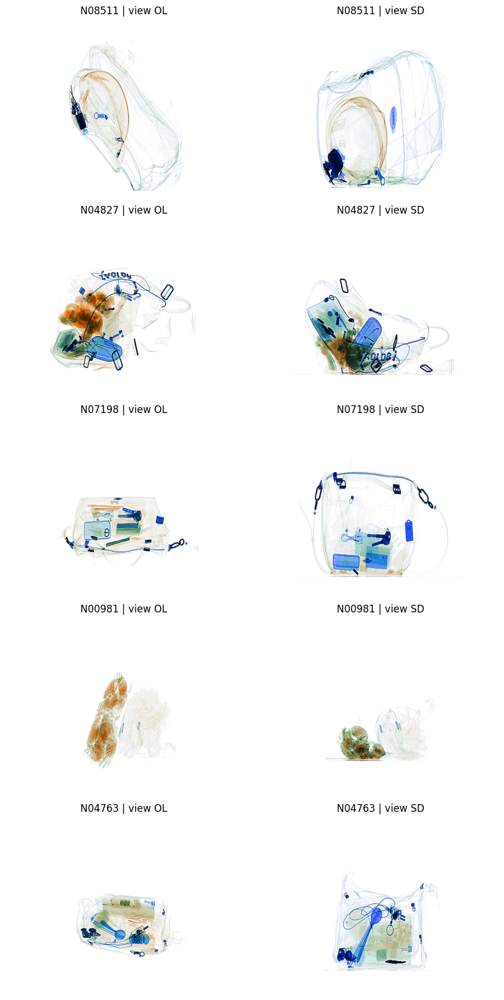

In [51]:
plot_dual_view_samples(df_negative, n=5)


## Fase 5 — Preprocessing y particiones train / validation / test

El autoencoder se entrena únicamente con imágenes normales. La idea es que aprenda la distribución visual de equipaje normal y, más adelante, usemos el error de reconstrucción para comparar normales contra anomalías.

Como DvXray es dual-view, no debemos dividir por imagen individual: las dos vistas de una misma maleta comparten contenido y contexto. Si una vista cae en train y la otra en validation o test, habría **data leakage**. Por eso dividimos por `sample_id`.

Reservamos también un `test_normal`: este conjunto no contiene anomalías todavía, pero será útil más adelante para compararlo contra muestras positivas en el test final.


### 5.1 Configuración de preprocesado y partición

Centralizamos los parámetros de imagen, batch y reproducibilidad para que las siguientes fases sean fáciles de ajustar.


In [52]:
from sklearn.model_selection import train_test_split


IMG_SIZE = 128
BATCH_SIZE = 32
NUM_WORKERS = 0
RANDOM_STATE = 42

TRAIN_RATIO = 0.70
VAL_RATIO = 0.15
TEST_NORMAL_RATIO = 0.15

print(f"IMG_SIZE: {IMG_SIZE}")
print(f"BATCH_SIZE: {BATCH_SIZE}")
print(f"NUM_WORKERS: {NUM_WORKERS}")
print(f"RANDOM_STATE: {RANDOM_STATE}")


IMG_SIZE: 128
BATCH_SIZE: 32
NUM_WORKERS: 0
RANDOM_STATE: 42


### 5.2 Split reproducible por `sample_id`

Primero dividimos los identificadores únicos de muestra. Después asignamos todas las imágenes de cada muestra al mismo split.


In [53]:
if df_negative.empty:
    raise ValueError("df_negative está vacío. Ejecuta primero la Fase 3.")

unique_sample_ids = df_negative["sample_id"].drop_duplicates().sort_values()

train_ids, temp_ids = train_test_split(
    unique_sample_ids,
    train_size=TRAIN_RATIO,
    random_state=RANDOM_STATE,
    shuffle=True,
)

val_size_relative = VAL_RATIO / (VAL_RATIO + TEST_NORMAL_RATIO)
val_ids, test_normal_ids = train_test_split(
    temp_ids,
    train_size=val_size_relative,
    random_state=RANDOM_STATE,
    shuffle=True,
)

split_by_sample_id = {
    **{sample_id: "train" for sample_id in train_ids},
    **{sample_id: "validation" for sample_id in val_ids},
    **{sample_id: "test_normal" for sample_id in test_normal_ids},
}

df_negative = df_negative.copy()
df_negative["split"] = df_negative["sample_id"].map(split_by_sample_id)

df_train = df_negative[df_negative["split"] == "train"].reset_index(drop=True)
df_val = df_negative[df_negative["split"] == "validation"].reset_index(drop=True)
df_test_normal = df_negative[df_negative["split"] == "test_normal"].reset_index(drop=True)

print(f"df_train: {df_train.shape}")
print(f"df_val: {df_val.shape}")
print(f"df_test_normal: {df_test_normal.shape}")


df_train: (15398, 7)
df_val: (3300, 7)
df_test_normal: (3302, 7)


### 5.3 Validación de splits

Comprobamos tamaño, distribución de vistas y ausencia de `sample_id` repetidos entre splits.


In [54]:
split_summary = (
    df_negative.groupby("split")
    .agg(
        num_images=("image_path", "count"),
        num_sample_ids=("sample_id", "nunique"),
        num_anomalies=("is_anomaly", "sum"),
    )
    .reset_index()
)

print("Resumen por split:")
display(split_summary)

print("Distribución de view_id por split:")
display(pd.crosstab(df_negative["split"], df_negative["view_id"]))

train_id_set = set(df_train["sample_id"])
val_id_set = set(df_val["sample_id"])
test_normal_id_set = set(df_test_normal["sample_id"])

overlap_train_val = train_id_set & val_id_set
overlap_train_test = train_id_set & test_normal_id_set
overlap_val_test = val_id_set & test_normal_id_set

leakage_report = {
    "train_val_overlap": len(overlap_train_val),
    "train_test_normal_overlap": len(overlap_train_test),
    "val_test_normal_overlap": len(overlap_val_test),
}

print("Comprobación de leakage por sample_id:")
display(leakage_report)

assert len(overlap_train_val) == 0
assert len(overlap_train_test) == 0
assert len(overlap_val_test) == 0


Resumen por split:


,split,num_images,num_sample_ids,num_anomalies
0,test_normal,3302,1651,0
1,train,15398,7699,0
2,validation,3300,1650,0


Distribución de view_id por split:


view_id,OL,SD
split,,
test_normal,1651,1651
train,7699,7699
validation,1650,1650


Comprobación de leakage por sample_id:


{'train_val_overlap': 0,
 'train_test_normal_overlap': 0,
 'val_test_normal_overlap': 0}

## Fase 6 — Dataset y DataLoader

Ahora convertimos el DataFrame en objetos de PyTorch. Como trabajamos con un autoencoder, el input y el target son la misma imagen.

Cada item del dataset devolverá:

```python
image_tensor, image_tensor, metadata_dict
```

La imagen se leerá siempre como RGB y se convertirá a tensor en rango `[0, 1]`.


### 6.1 Transforms

Para esta baseline usamos un preprocesado mínimo:

- Resize a `128x128`.
- Conversión a tensor.
- Rango `[0, 1]` mediante `ToTensor`.

No aplicamos augmentations todavía para mantener la primera línea base simple y reproducible.


In [55]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms


autoencoder_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
])


### 6.2 Clase `XrayAutoencoderDataset`

Esta clase usa `image_path` para leer la imagen y devuelve la misma imagen como entrada y objetivo.


In [56]:
class XrayAutoencoderDataset(Dataset):
    def __init__(self, dataframe: pd.DataFrame, transform=None):
        self.dataframe = dataframe.reset_index(drop=True).copy()
        self.transform = transform

    def __len__(self) -> int:
        return len(self.dataframe)

    def __getitem__(self, index: int):
        row = self.dataframe.iloc[index]
        image_path = Path(row["image_path"])

        image = Image.open(image_path).convert("RGB")
        if self.transform is not None:
            image_tensor = self.transform(image)
        else:
            image_tensor = transforms.ToTensor()(image)

        metadata = {
            "image_path": str(image_path),
            "sample_id": str(row["sample_id"]),
            "view_id": str(row["view_id"]),
            "is_anomaly": int(row["is_anomaly"]),
            "split": str(row["split"]),
        }

        return image_tensor, image_tensor.clone(), metadata


### 6.3 Creación de datasets y dataloaders

Creamos un `DataLoader` para cada split. El train loader se baraja; validation y test normal se mantienen ordenados.


In [57]:
train_dataset = XrayAutoencoderDataset(df_train, transform=autoencoder_transform)
val_dataset = XrayAutoencoderDataset(df_val, transform=autoencoder_transform)
test_normal_dataset = XrayAutoencoderDataset(df_test_normal, transform=autoencoder_transform)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
)

test_normal_loader = DataLoader(
    test_normal_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
)

print(f"train_dataset: {len(train_dataset)} imágenes")
print(f"val_dataset: {len(val_dataset)} imágenes")
print(f"test_normal_dataset: {len(test_normal_dataset)} imágenes")


train_dataset: 15398 imágenes
val_dataset: 3300 imágenes
test_normal_dataset: 3302 imágenes


### 6.4 Validación de un batch

Antes de seguir hacia el modelo, verificamos shapes y rango de tensores.


In [58]:
inputs, targets, metadata = next(iter(train_loader))

print(f"Input shape:  {inputs.shape}")
print(f"Target shape: {targets.shape}")
print(f"Input min: {inputs.min().item():.4f}")
print(f"Input max: {inputs.max().item():.4f}")
print(f"Primeros sample_id del batch: {metadata['sample_id'][:5]}")
print(f"Primeras vistas del batch: {metadata['view_id'][:5]}")

assert inputs.shape == targets.shape
assert inputs.ndim == 4
assert inputs.shape[1] == 3
assert 0.0 <= inputs.min().item() <= 1.0
assert 0.0 <= inputs.max().item() <= 1.0


Input shape:  torch.Size([32, 3, 128, 128])
Target shape: torch.Size([32, 3, 128, 128])
Input min: 0.0000
Input max: 1.0000
Primeros sample_id del batch: ['N02480', 'N00305', 'N08268', 'N05899', 'N10844']
Primeras vistas del batch: ['OL', 'SD', 'SD', 'SD', 'OL']


### 6.5 Visualización desde el DataLoader

Esta función permite inspeccionar cualquier loader y confirmar que el preprocesado conserva imágenes visualmente coherentes.


In [59]:
def show_tensor_batch(loader: DataLoader, n: int = 8) -> None:
    inputs, _, metadata = next(iter(loader))
    n = min(n, inputs.size(0))

    cols = min(4, n)
    rows = int(np.ceil(n / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(3.5 * cols, 3.4 * rows))
    axes = np.array(axes).reshape(-1)

    for idx in range(n):
        image = inputs[idx].permute(1, 2, 0).cpu().numpy()
        axes[idx].imshow(np.clip(image, 0, 1))
        axes[idx].set_title(f"{metadata['sample_id'][idx]} | {metadata['view_id'][idx]}")
        axes[idx].axis("off")

    for ax in axes[n:]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()


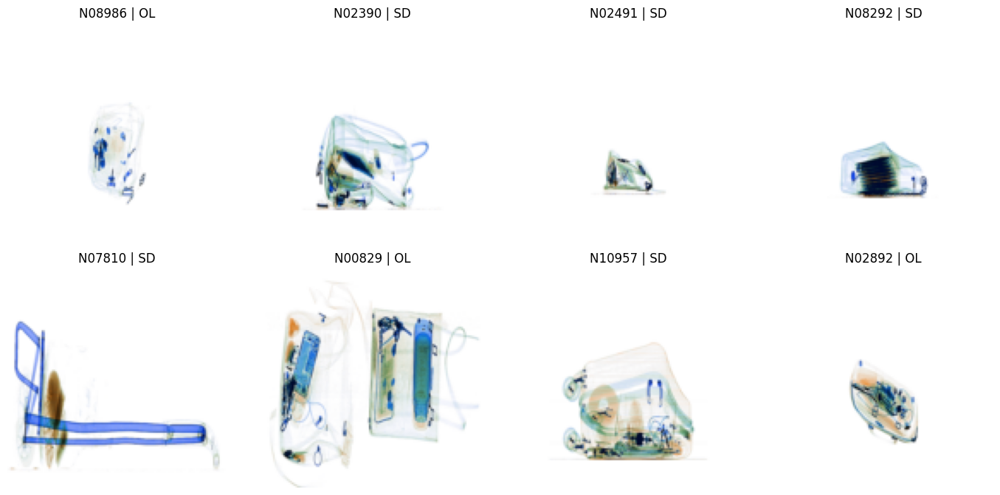

In [60]:
show_tensor_batch(train_loader, n=8)


## Fase 7 — Autoencoder convolucional

El autoencoder aprende a reconstruir imágenes normales de equipaje.

- El **encoder** comprime la imagen y extrae patrones visuales cada vez más abstractos.
- El **bottleneck** es la representación comprimida. Para imágenes `128x128`, esta arquitectura reduce la imagen hasta aproximadamente `128 x 16 x 16`.
- El **decoder** intenta reconstruir la imagen original desde esa representación comprimida.

Como los tensores de entrada están en rango `[0, 1]`, usamos `Sigmoid` al final del decoder para que la salida también quede en ese rango.


### 7.1 Definición del modelo

La arquitectura es pequeña y clara para una primera baseline. Más adelante se podrá aumentar profundidad, añadir regularización o probar pérdidas perceptuales.


In [61]:
from torch import nn


device = DEVICE


class ConvAutoencoder(nn.Module):
    def __init__(self):
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(32, 3, kernel_size=2, stride=2),
            nn.Sigmoid(),
        )

    def forward(self, x):
        encoded = self.encoder(x)
        reconstructed = self.decoder(encoded)
        return reconstructed


### 7.2 Instanciación y número de parámetros

Comprobamos el tamaño del modelo antes de entrenar.


In [62]:
def count_parameters(model: nn.Module) -> int:
    return sum(parameter.numel() for parameter in model.parameters() if parameter.requires_grad)


model = ConvAutoencoder().to(device)

print(model)
print(f"Parámetros entrenables: {count_parameters(model):,}")


ConvAutoencoder(
  (encoder): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (decoder): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(2, 2), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): ConvTranspose2d(64, 32, kernel_size=(2, 2), stride=(2, 2))
    (3): ReLU(inplace=True)
    (4): ConvTranspose2d(32, 3, kernel_size=(2, 2), stride=(2, 2))
    (5): Sigmoid()
  )
)
Parámetros entrenables: 134,691


### 7.3 Prueba con un batch real

Antes de entrenar, pasamos un batch real por el modelo y verificamos que la reconstrucción tiene la misma forma que la entrada.


In [63]:
inputs, targets, metadata = next(iter(train_loader))
inputs = inputs.to(device)

with torch.no_grad():
    outputs = model(inputs)

print(f"Input shape:  {inputs.shape}")
print(f"Output shape: {outputs.shape}")

assert outputs.shape == inputs.shape


Input shape:  torch.Size([32, 3, 128, 128])
Output shape: torch.Size([32, 3, 128, 128])


## Fase 8 — Entrenamiento

Entrenamos el autoencoder solo con equipaje normal. La pérdida será `MSELoss`, que mide el error medio entre la imagen original y su reconstrucción.

Más adelante, ese error de reconstrucción se calculará por imagen y se usará como **score de anomalía**: si una imagen se reconstruye mal, puede ser visualmente distinta de lo aprendido como normal.

En esta fase todavía no usamos positivos, threshold, ROC, matriz de confusión ni heatmaps definitivos.


### 8.1 Configuración de entrenamiento

Guardaremos el mejor modelo según `val_loss`.


In [64]:
from tqdm.auto import tqdm


CHECKPOINTS_DIR = OUTPUT_DIR / "checkpoints"
CHECKPOINTS_DIR.mkdir(parents=True, exist_ok=True)

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

EPOCHS = 15
best_model_path = CHECKPOINTS_DIR / "best_conv_autoencoder_dvxray.pt"

history = {
    "train_loss": [],
    "val_loss": [],
}

print(f"Checkpoints dir: {CHECKPOINTS_DIR}")
print(f"Best model path: {best_model_path}")


Checkpoints dir: outputs\checkpoints
Best model path: outputs\checkpoints\best_conv_autoencoder_dvxray.pt


### 8.2 Funciones de entrenamiento y validación

Separar estas funciones mantiene el loop principal limpio y reutilizable.


In [65]:
def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    num_images = 0

    for inputs, targets, _ in loader:
        inputs = inputs.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        batch_size = inputs.size(0)
        running_loss += loss.item() * batch_size
        num_images += batch_size

    return running_loss / max(num_images, 1)


@torch.no_grad()
def validate_one_epoch(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    num_images = 0

    for inputs, targets, _ in loader:
        inputs = inputs.to(device)
        targets = targets.to(device)

        outputs = model(inputs)
        loss = criterion(outputs, targets)

        batch_size = inputs.size(0)
        running_loss += loss.item() * batch_size
        num_images += batch_size

    return running_loss / max(num_images, 1)


### 8.3 Loop de entrenamiento

Esta celda entrena el modelo durante `15` epochs. En GPU debería ser razonable para una primera baseline con imágenes `128x128`.


In [66]:
best_val_loss = float("inf")

epoch_iterator = tqdm(range(1, EPOCHS + 1), desc="Entrenamiento")
for epoch in epoch_iterator:
    train_loss = train_one_epoch(model, train_loader, criterion, optimizer, device)
    val_loss = validate_one_epoch(model, val_loader, criterion, device)

    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), best_model_path)

    epoch_iterator.set_postfix({
        "epoch": epoch,
        "train_loss": f"{train_loss:.6f}",
        "val_loss": f"{val_loss:.6f}",
    })

print(f"Mejor val_loss: {best_val_loss:.6f}")
print(f"Mejor modelo guardado en: {best_model_path}")


Entrenamiento:   0%|          | 0/15 [00:00<?, ?it/s]

Mejor val_loss: 0.001172
Mejor modelo guardado en: outputs\checkpoints\best_conv_autoencoder_dvxray.pt


### 8.4 Curva de entrenamiento

La curva permite comprobar si el modelo aprende a reconstruir normales y si hay señales de sobreajuste.


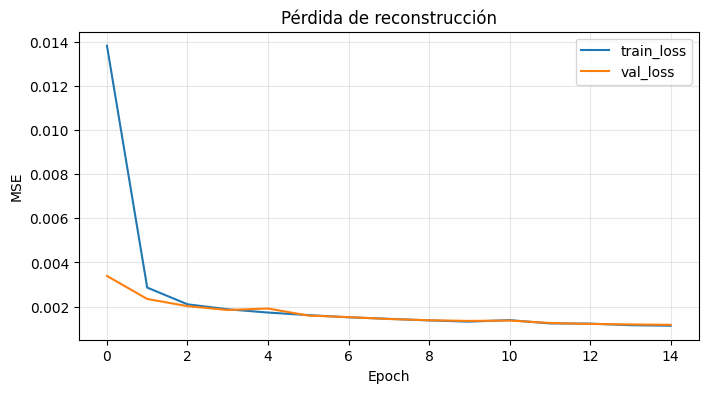

In [67]:
plt.figure(figsize=(8, 4))
plt.plot(history["train_loss"], label="train_loss")
plt.plot(history["val_loss"], label="val_loss")
plt.xlabel("Epoch")
plt.ylabel("MSE")
plt.title("Pérdida de reconstrucción")
plt.legend()
plt.grid(alpha=0.3)
plt.show()


### 8.5 Carga del mejor modelo

Después del entrenamiento, restauramos los pesos con menor pérdida de validación.


In [68]:
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.eval()

print("Mejor modelo cargado correctamente.")


Mejor modelo cargado correctamente.


### 8.6 Visualización rápida: original vs reconstrucción

Mostramos algunas imágenes normales de validation junto a sus reconstrucciones. Todavía no calculamos heatmaps ni scores de anomalía; eso vendrá en la siguiente fase.


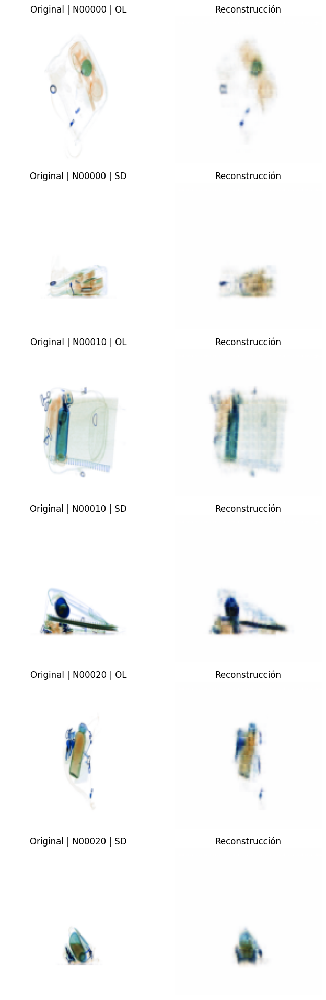

In [69]:
@torch.no_grad()
def show_reconstruction_examples(model, loader, device, n: int = 6) -> None:
    model.eval()
    inputs, _, metadata = next(iter(loader))
    inputs = inputs.to(device)
    outputs = model(inputs).cpu()
    inputs = inputs.cpu()

    n = min(n, inputs.size(0))
    fig, axes = plt.subplots(n, 2, figsize=(7, 3.2 * n))
    if n == 1:
        axes = np.expand_dims(axes, axis=0)

    for idx in range(n):
        original = inputs[idx].permute(1, 2, 0).numpy()
        reconstructed = outputs[idx].permute(1, 2, 0).numpy()

        axes[idx, 0].imshow(np.clip(original, 0, 1))
        axes[idx, 0].set_title(f"Original | {metadata['sample_id'][idx]} | {metadata['view_id'][idx]}")
        axes[idx, 0].axis("off")

        axes[idx, 1].imshow(np.clip(reconstructed, 0, 1))
        axes[idx, 1].set_title("Reconstrucción")
        axes[idx, 1].axis("off")

    plt.tight_layout()
    plt.show()


show_reconstruction_examples(model, val_loader, device, n=6)


## Fase 9 — Análisis del error de reconstrucción

El **reconstruction error** mide cuánto se parece la reconstrucción del autoencoder a la imagen original. En este notebook usamos MSE por imagen:

```text
reconstruction_mse = mean((original - reconstruction)²)
```

Como el modelo solo ha visto imágenes normales, ahora analizamos la distribución del error en normales de `train`, `validation` y `test_normal`. Todavía no estamos evaluando anomalías; solo estamos entendiendo qué errores son habituales en equipaje normal.


### 9.1 Carga del mejor modelo

Restauramos el checkpoint entrenado con menor `val_loss`.


In [70]:
best_model_path = CHECKPOINTS_DIR / "best_conv_autoencoder_dvxray.pt"

if not best_model_path.exists():
    raise FileNotFoundError(f"No se encontró el checkpoint esperado: {best_model_path}")

model.load_state_dict(torch.load(best_model_path, map_location=device))
model.eval()

print(f"Checkpoint cargado: {best_model_path}")


Checkpoint cargado: outputs\checkpoints\best_conv_autoencoder_dvxray.pt


### 9.2 Cálculo de errores por imagen

Calculamos MSE por imagen y conservamos la metadata necesaria para poder inspeccionar casos concretos.


In [71]:
@torch.no_grad()
def compute_reconstruction_errors(model, loader, device) -> pd.DataFrame:
    model.eval()
    records = []

    for inputs, targets, metadata in tqdm(loader, desc="Calculando errores"):
        inputs = inputs.to(device)
        targets = targets.to(device)

        outputs = model(inputs)
        per_image_mse = torch.mean((outputs - targets) ** 2, dim=(1, 2, 3)).detach().cpu().numpy()

        batch_size = inputs.size(0)
        for idx in range(batch_size):
            records.append({
                "image_path": metadata["image_path"][idx],
                "sample_id": metadata["sample_id"][idx],
                "view_id": metadata["view_id"][idx],
                "split": metadata["split"][idx],
                "is_anomaly": int(metadata["is_anomaly"][idx]),
                "reconstruction_mse": float(per_image_mse[idx]),
            })

    return pd.DataFrame.from_records(records)


### 9.3 Errores en train, validation y test normal

Generamos tres DataFrames de errores. El conjunto `test_normal` se mantiene separado porque más adelante se comparará contra imágenes positivas/anómalas.


In [72]:
df_train_errors = compute_reconstruction_errors(model, train_loader, device)
df_val_errors = compute_reconstruction_errors(model, val_loader, device)
df_test_normal_errors = compute_reconstruction_errors(model, test_normal_loader, device)

print(f"df_train_errors: {df_train_errors.shape}")
print(f"df_val_errors: {df_val_errors.shape}")
print(f"df_test_normal_errors: {df_test_normal_errors.shape}")
display(df_val_errors.head())


Calculando errores:   0%|          | 0/482 [00:00<?, ?it/s]

Calculando errores:   0%|          | 0/104 [00:00<?, ?it/s]

Calculando errores:   0%|          | 0/104 [00:00<?, ?it/s]

df_train_errors: (15398, 6)
df_val_errors: (3300, 6)
df_test_normal_errors: (3302, 6)


,image_path,sample_id,view_id,split,is_anomaly,reconstruction_mse
0,DvXray_Negative_Samples\N00000_OL.png,N00000,OL,validation,0,0.000359
1,DvXray_Negative_Samples\N00000_SD.png,N00000,SD,validation,0,0.000513
2,DvXray_Negative_Samples\N00010_OL.png,N00010,OL,validation,0,0.000797
3,DvXray_Negative_Samples\N00010_SD.png,N00010,SD,validation,0,0.001181
4,DvXray_Negative_Samples\N00020_OL.png,N00020,OL,validation,0,0.000648


### 9.4 Estadísticas descriptivas

Estas estadísticas ayudan a entender qué valores de error son normales para imágenes normales.


In [73]:
def reconstruction_error_summary(df: pd.DataFrame, split_name: str) -> dict:
    values = df["reconstruction_mse"]
    return {
        "split": split_name,
        "count": int(values.count()),
        "mean": float(values.mean()),
        "std": float(values.std()),
        "min": float(values.min()),
        "p50": float(values.quantile(0.50)),
        "p75": float(values.quantile(0.75)),
        "p90": float(values.quantile(0.90)),
        "p95": float(values.quantile(0.95)),
        "p99": float(values.quantile(0.99)),
        "max": float(values.max()),
    }


error_summary = pd.DataFrame([
    reconstruction_error_summary(df_train_errors, "train"),
    reconstruction_error_summary(df_val_errors, "validation"),
    reconstruction_error_summary(df_test_normal_errors, "test_normal"),
])

display(error_summary)


,split,count,mean,std,min,p50,p75,p90,p95,p99,max
0,train,15398,0.001131,0.000709,0.000020,0.000980,0.001418,0.001953,0.002415,0.003778,0.007107
1,validation,3300,0.001172,0.000761,0.000018,0.001007,0.001456,0.002018,0.002600,0.004126,0.008945
2,test_normal,3302,0.001093,0.000678,0.000017,0.000945,0.001363,0.001860,0.002334,0.003545,0.005757


### 9.5 Distribución visual del error

Comparamos train, validation y test normal con histogramas y boxplots. Si las distribuciones son parecidas, el split normal es razonablemente consistente.


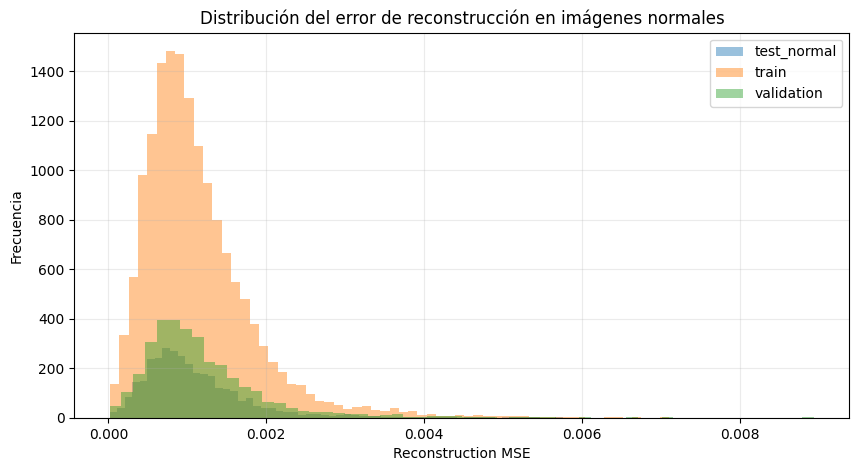

In [74]:
df_all_normal_errors = pd.concat(
    [
        df_train_errors.assign(error_split="train"),
        df_val_errors.assign(error_split="validation"),
        df_test_normal_errors.assign(error_split="test_normal"),
    ],
    ignore_index=True,
)

plt.figure(figsize=(10, 5))
for split_name, split_df in df_all_normal_errors.groupby("error_split"):
    plt.hist(
        split_df["reconstruction_mse"],
        bins=60,
        alpha=0.45,
        label=split_name,
    )

plt.xlabel("Reconstruction MSE")
plt.ylabel("Frecuencia")
plt.title("Distribución del error de reconstrucción en imágenes normales")
plt.legend()
plt.grid(alpha=0.25)
plt.show()


<Figure size 800x500 with 0 Axes>

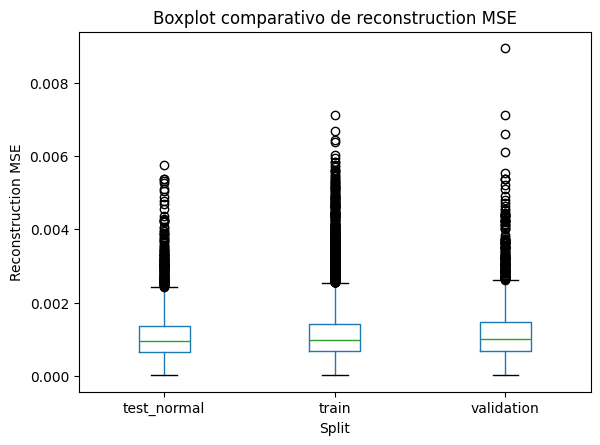

In [75]:
plt.figure(figsize=(8, 5))
df_all_normal_errors.boxplot(column="reconstruction_mse", by="error_split", grid=False)
plt.suptitle("")
plt.title("Boxplot comparativo de reconstruction MSE")
plt.xlabel("Split")
plt.ylabel("Reconstruction MSE")
plt.show()


### 9.6 Ranking de errores normales

Miramos los casos normales con menor y mayor error. Los mayores errores no son anomalías todavía: son normales difíciles de reconstruir.


In [76]:
lowest_error_normals = df_all_normal_errors.sort_values("reconstruction_mse", ascending=True).head(10)
highest_error_normals = df_all_normal_errors.sort_values("reconstruction_mse", ascending=False).head(10)

print("Imágenes normales con menor error:")
display(lowest_error_normals[["image_path", "sample_id", "view_id", "error_split", "reconstruction_mse"]])

print("Imágenes normales con mayor error:")
display(highest_error_normals[["image_path", "sample_id", "view_id", "error_split", "reconstruction_mse"]])


Imágenes normales con menor error:


,image_path,sample_id,view_id,error_split,reconstruction_mse
19674,DvXray_Negative_Samples\N03281_OL.png,N03281,OL,test_normal,0.000017
15440,DvXray_Negative_Samples\N00111_OL.png,N00111,OL,validation,0.000018
4916,DvXray_Negative_Samples\N02525_OL.png,N02525,OL,train,0.000020
16421,DvXray_Negative_Samples\N03316_SD.png,N03316,SD,validation,0.000023
14037,DvXray_Negative_Samples\N04736_OL.png,N04736,OL,train,0.000023
15810,DvXray_Negative_Samples\N01322_OL.png,N01322,OL,validation,0.000023
16420,DvXray_Negative_Samples\N03316_OL.png,N03316,OL,validation,0.000025
9165,DvXray_Negative_Samples\N02866_OL.png,N02866,OL,train,0.000026
15441,DvXray_Negative_Samples\N00111_SD.png,N00111,SD,validation,0.000028
13463,DvXray_Negative_Samples\N08858_SD.png,N08858,SD,train,0.000029


Imágenes normales con mayor error:


,image_path,sample_id,view_id,error_split,reconstruction_mse
17962,DvXray_Negative_Samples\N08524_OL.png,N08524,OL,validation,0.008945
17559,DvXray_Negative_Samples\N07109_SD.png,N07109,SD,validation,0.007117
7850,DvXray_Negative_Samples\N01115_OL.png,N01115,OL,train,0.007107
2486,DvXray_Negative_Samples\N01115_SD.png,N01115,SD,train,0.006669
17558,DvXray_Negative_Samples\N07109_OL.png,N07109,OL,validation,0.006609
6652,DvXray_Negative_Samples\N00938_OL.png,N00938,OL,train,0.006426
5347,DvXray_Negative_Samples\N10744_OL.png,N10744,OL,train,0.006392
17832,DvXray_Negative_Samples\N08085_OL.png,N08085,OL,validation,0.006115
3887,DvXray_Negative_Samples\N10268_OL.png,N10268,OL,train,0.006026
6286,DvXray_Negative_Samples\N10087_OL.png,N10087,OL,train,0.005939


## Fase 10 — Selección del umbral

El threshold se calcula usando solo **validation normal**. Esto evita mirar el test al calibrar el umbral.

Un threshold alto, como el percentil 99, reduce falsos positivos en normales porque solo marca como sospechosas las imágenes normales con errores excepcionalmente altos. La contrapartida es que, cuando añadamos anomalías reales, podría dejar pasar anomalías sutiles.

Todavía falta evaluar contra imágenes positivas/anómalas. Por eso en esta fase no calculamos matriz de confusión, precision, recall, F1 ni ROC-AUC.


### 10.1 Thresholds candidatos

Comparamos varios criterios sobre validation normal:

- `mean + 2 * std`
- `mean + 3 * std`
- Percentil 95
- Percentil 99


In [77]:
val_errors = df_val_errors["reconstruction_mse"]

threshold_candidates = {
    "mean_plus_2std": float(val_errors.mean() + 2 * val_errors.std()),
    "mean_plus_3std": float(val_errors.mean() + 3 * val_errors.std()),
    "p95_validation": float(val_errors.quantile(0.95)),
    "p99_validation": float(val_errors.quantile(0.99)),
}

threshold_candidates


{'mean_plus_2std': 0.0026942127039557163,
 'mean_plus_3std': 0.003455400887347639,
 'p95_validation': 0.002600402617827057,
 'p99_validation': 0.004125540461391204}

### 10.2 Impacto de cada threshold en normales

Como solo tenemos normales, medimos qué porcentaje de normales quedarían marcadas como sospechosas. Ese porcentaje es una estimación de falsos positivos sobre normales.


In [78]:
def suspicious_rate(df: pd.DataFrame, threshold: float) -> float:
    return 100 * float((df["reconstruction_mse"] > threshold).mean())


threshold_rows = []
for threshold_name, threshold_value in threshold_candidates.items():
    threshold_rows.append({
        "threshold_name": threshold_name,
        "threshold_value": threshold_value,
        "validation_normal_suspicious_pct": suspicious_rate(df_val_errors, threshold_value),
        "test_normal_suspicious_pct": suspicious_rate(df_test_normal_errors, threshold_value),
    })

df_threshold_summary = pd.DataFrame(threshold_rows).sort_values("threshold_value").reset_index(drop=True)
display(df_threshold_summary)


,threshold_name,threshold_value,validation_normal_suspicious_pct,test_normal_suspicious_pct
0,p95_validation,0.002600,5.000000,3.755300
1,mean_plus_2std,0.002694,4.575758,3.331314
2,mean_plus_3std,0.003455,2.030303,1.120533
3,p99_validation,0.004126,1.000000,0.514839


### 10.3 Threshold principal

Usaremos como umbral principal el percentil 99 de validation normal. Es una elección conservadora para reducir falsos positivos antes de introducir anomalías reales.


In [79]:
ANOMALY_THRESHOLD = threshold_candidates["p99_validation"]

print(f"ANOMALY_THRESHOLD: {ANOMALY_THRESHOLD:.8f}")
print("Criterio: percentil 99 de validation normal")


ANOMALY_THRESHOLD: 0.00412554
Criterio: percentil 99 de validation normal


### 10.4 Visualización del umbral

Marcamos el threshold principal sobre la distribución de validation normal y test normal.


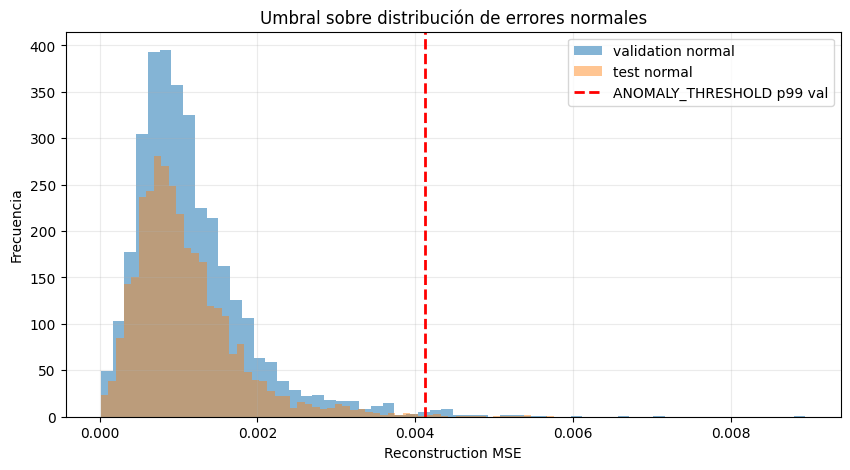

In [80]:
plt.figure(figsize=(10, 5))
plt.hist(df_val_errors["reconstruction_mse"], bins=60, alpha=0.55, label="validation normal")
plt.hist(df_test_normal_errors["reconstruction_mse"], bins=60, alpha=0.45, label="test normal")
plt.axvline(ANOMALY_THRESHOLD, color="red", linestyle="--", linewidth=2, label="ANOMALY_THRESHOLD p99 val")
plt.xlabel("Reconstruction MSE")
plt.ylabel("Frecuencia")
plt.title("Umbral sobre distribución de errores normales")
plt.legend()
plt.grid(alpha=0.25)
plt.show()


## Fase 11 — Métricas de evaluación

Hasta ahora el modelo solo ha aprendido a reconstruir equipaje normal. Para evaluar si el error de reconstrucción funciona como señal de sospecha, incorporamos un conjunto positivo/anómalo separado.

En este contexto:

- **TN**: imagen normal marcada como normal.
- **FP**: imagen normal marcada como sospechosa.
- **TP**: imagen positiva marcada como sospechosa.
- **FN**: imagen positiva marcada como normal.

El modelo no identifica el objeto ni localiza una amenaza. Solo compara cuánto se aleja la imagen de la normalidad visual aprendida. En seguridad, el **recall** es especialmente importante porque mide cuántas anomalías se priorizan para revisión, pero la **precision** también importa para no saturar al equipo humano con demasiadas falsas alarmas.

### 11.1 Carga configurable de muestras positivas

Buscamos las imágenes positivas en `DvXray_Positive_Samples/`. La celda está preparada para continuar aunque la carpeta todavía no exista: en ese caso se documenta el estado y las métricas quedan pendientes.

In [95]:
from sklearn.metrics import (
    accuracy_score,
    average_precision_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    f1_score,
    precision_recall_curve,
    precision_score,
    recall_score,
    roc_auc_score,
    RocCurveDisplay,
    PrecisionRecallDisplay,
    roc_curve,
)


POSITIVE_DATA_ROOT = Path("DvXray_Positive_Samples")
MAX_POSITIVE_TEST_IMAGES = 3000
POSITIVE_SOURCE_DATASET = "DvXray_positive"

print(f"POSITIVE_DATA_ROOT: {POSITIVE_DATA_ROOT.resolve()}")
print(f"Existe carpeta positiva: {POSITIVE_DATA_ROOT.exists()}")
print(f"Máximo de imágenes positivas para test: {MAX_POSITIVE_TEST_IMAGES}")

POSITIVE_DATA_ROOT: C:\Users\adnan\Desktop\tajamar-genai-tasks\09-AutoEncoders\DvXray_Positive_Samples
Existe carpeta positiva: True
Máximo de imágenes positivas para test: 3000


### 11.2 Construcción de `df_positive`

Cada fila representa una imagen positiva individual. Marcamos `is_anomaly = 1` porque estas muestras se usarán únicamente como anomalías de test.

In [96]:
def collect_image_paths(data_root: Path, recursive: bool = True) -> list[Path]:
    if not data_root.exists():
        return []

    iterator = data_root.rglob("*") if recursive else data_root.glob("*")
    return sorted(
        path
        for path in iterator
        if path.is_file() and path.suffix.lower() in IMAGE_EXTENSIONS
    )


def parse_positive_sample_and_view(image_path: Path) -> tuple[str, str]:
    metadata_path = image_path.with_suffix(".json")
    metadata = read_metadata(metadata_path) if metadata_path.exists() else {}

    sample_id, view_id = parse_sample_and_view(image_path, metadata)
    if view_id == "unknown":
        stem = image_path.stem
        for suffix in ("OL", "SD", "view1", "view2", "V1", "V2"):
            marker = f"_{suffix}"
            if stem.endswith(marker):
                return stem[: -len(marker)], suffix

    return sample_id, view_id


def validate_image_files(image_paths: list[Path]) -> list[str]:
    corrupt_paths = []
    for image_path in tqdm(image_paths, desc="Validando imágenes positivas"):
        try:
            with Image.open(image_path) as image:
                image.verify()
        except (UnidentifiedImageError, OSError):
            corrupt_paths.append(str(image_path))
    return corrupt_paths


positive_image_paths = collect_image_paths(POSITIVE_DATA_ROOT)
positive_corrupt_paths = validate_image_files(positive_image_paths) if positive_image_paths else []
positive_valid_paths = [
    path for path in positive_image_paths
    if str(path) not in set(positive_corrupt_paths)
]

positive_records = []
for image_path in positive_valid_paths:
    sample_id, view_id = parse_positive_sample_and_view(image_path)
    positive_records.append({
        "image_path": str(image_path),
        "sample_id": str(sample_id),
        "view_id": str(view_id),
        "is_anomaly": 1,
        "source_dataset": POSITIVE_SOURCE_DATASET,
        "split": "test_positive",
    })

df_positive = pd.DataFrame.from_records(
    positive_records,
    columns=["image_path", "sample_id", "view_id", "is_anomaly", "source_dataset", "split"],
)

print(f"Imágenes positivas encontradas: {len(positive_image_paths)}")
print(f"Imágenes positivas válidas: {len(df_positive)}")
print(f"Imágenes positivas corruptas: {len(positive_corrupt_paths)}")
print(f"Sample_id positivos únicos: {df_positive['sample_id'].nunique() if len(df_positive) else 0}")

if len(df_positive):
    display(df_positive["view_id"].value_counts().rename("num_images").to_frame())
    display(df_positive.head())
else:
    print("No se encontraron positivos todavía. Añade la carpeta DvXray_Positive_Samples/ para ejecutar la evaluación completa.")

Validando imágenes positivas:   0%|          | 0/10000 [00:00<?, ?it/s]

Imágenes positivas encontradas: 10000
Imágenes positivas válidas: 10000
Imágenes positivas corruptas: 0
Sample_id positivos únicos: 5000


,num_images
view_id,
OL,5000
SD,5000


,image_path,sample_id,view_id,is_anomaly,source_dataset,split
0,DvXray_Positive_Samples\P00000_OL.png,P00000,OL,1,DvXray_positive,test_positive
1,DvXray_Positive_Samples\P00000_SD.png,P00000,SD,1,DvXray_positive,test_positive
2,DvXray_Positive_Samples\P00001_OL.png,P00001,OL,1,DvXray_positive,test_positive
3,DvXray_Positive_Samples\P00001_SD.png,P00001,SD,1,DvXray_positive,test_positive
4,DvXray_Positive_Samples\P00002_OL.png,P00002,OL,1,DvXray_positive,test_positive


### 11.3 Subconjunto positivo reproducible

Limitamos el número de positivos para mantener la evaluación rápida y comparable. El muestreo usa la misma semilla del proyecto.

In [97]:
if len(df_positive) > MAX_POSITIVE_TEST_IMAGES:
    df_positive_test = (
        df_positive
        .sample(n=MAX_POSITIVE_TEST_IMAGES, random_state=RANDOM_STATE)
        .sort_values(["sample_id", "view_id", "image_path"])
        .reset_index(drop=True)
    )
else:
    df_positive_test = df_positive.copy().reset_index(drop=True)

print(f"df_positive_test: {df_positive_test.shape}")
print(f"Sample_id positivos en test: {df_positive_test['sample_id'].nunique() if len(df_positive_test) else 0}")

df_positive_test: (3000, 6)
Sample_id positivos en test: 2527


### 11.4 DataLoader positivo y errores de reconstrucción

Usamos exactamente el mismo `Dataset`, los mismos `transforms` y el mismo modelo. La única diferencia es la etiqueta `is_anomaly = 1`, que se emplea para evaluar después.

In [98]:
positive_dataset = XrayAutoencoderDataset(df_positive_test, transform=autoencoder_transform)
positive_loader = DataLoader(
    positive_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
)

if len(positive_dataset):
    df_positive_errors = compute_reconstruction_errors(model, positive_loader, device)
else:
    df_positive_errors = pd.DataFrame(columns=[
        "image_path",
        "sample_id",
        "view_id",
        "split",
        "is_anomaly",
        "reconstruction_mse",
    ])

print(f"Errores positivos calculados: {df_positive_errors.shape}")
display(df_positive_errors.head())

Calculando errores:   0%|          | 0/94 [00:00<?, ?it/s]

Errores positivos calculados: (3000, 6)


,image_path,sample_id,view_id,split,is_anomaly,reconstruction_mse
0,DvXray_Positive_Samples\P00000_OL.png,P00000,OL,test_positive,1,0.001701
1,DvXray_Positive_Samples\P00001_SD.png,P00001,SD,test_positive,1,0.002443
2,DvXray_Positive_Samples\P00004_OL.png,P00004,OL,test_positive,1,0.003191
3,DvXray_Positive_Samples\P00005_OL.png,P00005,OL,test_positive,1,0.001397
4,DvXray_Positive_Samples\P00006_OL.png,P00006,OL,test_positive,1,0.002079


### 11.5 Test combinado y predicción por umbral

Combinamos normales reservados de test con positivos. La regla de decisión se mantiene fija:

```text
predicted_anomaly = reconstruction_mse > ANOMALY_THRESHOLD
```

In [99]:
df_test_all_errors = pd.concat(
    [df_test_normal_errors, df_positive_errors],
    ignore_index=True,
)

df_test_all_errors["predicted_anomaly"] = (
    df_test_all_errors["reconstruction_mse"] > ANOMALY_THRESHOLD
).astype(int)

print(f"Test combinado: {df_test_all_errors.shape}")
display(df_test_all_errors["is_anomaly"].value_counts().rename("num_images").to_frame())
display(df_test_all_errors["predicted_anomaly"].value_counts().rename("num_predictions").to_frame())
display(df_test_all_errors.head())

Test combinado: (6302, 7)


,num_images
is_anomaly,
0,3302
1,3000


,num_predictions
predicted_anomaly,
0,6051
1,251


,image_path,sample_id,view_id,split,is_anomaly,reconstruction_mse,predicted_anomaly
0,DvXray_Negative_Samples\N00003_OL.png,N00003,OL,test_normal,0,0.000638,0
1,DvXray_Negative_Samples\N00003_SD.png,N00003,SD,test_normal,0,0.000690,0
2,DvXray_Negative_Samples\N00008_OL.png,N00008,OL,test_normal,0,0.000672,0
3,DvXray_Negative_Samples\N00008_SD.png,N00008,SD,test_normal,0,0.000953,0
4,DvXray_Negative_Samples\N00012_OL.png,N00012,OL,test_normal,0,0.000889,0


### 11.6 Métricas cuantitativas

La matriz de confusión resume el comportamiento del umbral. Las curvas ROC y precision-recall se calculan con el error continuo, no solo con la predicción binaria.

In [100]:
y_true = df_test_all_errors["is_anomaly"].astype(int).to_numpy()
y_score = df_test_all_errors["reconstruction_mse"].astype(float).to_numpy()
y_pred = df_test_all_errors["predicted_anomaly"].astype(int).to_numpy()

metrics_summary = {
    "accuracy": accuracy_score(y_true, y_pred) if len(y_true) else np.nan,
    "precision": precision_score(y_true, y_pred, zero_division=0) if len(y_true) else np.nan,
    "recall": recall_score(y_true, y_pred, zero_division=0) if len(y_true) else np.nan,
    "f1": f1_score(y_true, y_pred, zero_division=0) if len(y_true) else np.nan,
    "roc_auc": np.nan,
    "average_precision": np.nan,
}

has_two_classes = len(np.unique(y_true)) == 2
if has_two_classes:
    metrics_summary["roc_auc"] = roc_auc_score(y_true, y_score)
    metrics_summary["average_precision"] = average_precision_score(y_true, y_score)
else:
    print("ROC-AUC y Average Precision requieren normales y anomalías en el test combinado.")

df_metrics = pd.DataFrame([metrics_summary]).T.rename(columns={0: "value"})
display(df_metrics)

cm = confusion_matrix(y_true, y_pred, labels=[0, 1]) if len(y_true) else np.array([[0, 0], [0, 0]])
df_confusion = pd.DataFrame(
    cm,
    index=["real_normal", "real_anomaly"],
    columns=["pred_normal", "pred_suspicious"],
)
display(df_confusion)

,value
accuracy,0.558394
precision,0.932271
recall,0.078000
f1,0.143956
roc_auc,0.785110
average_precision,0.766928


,pred_normal,pred_suspicious
real_normal,3285,17
real_anomaly,2766,234


### 11.7 Visualización de métricas

Las gráficas ayudan a ver si las distribuciones de error de normales y anomalías se separan. Si se solapan mucho, el umbral tendrá falsos positivos o falsos negativos.

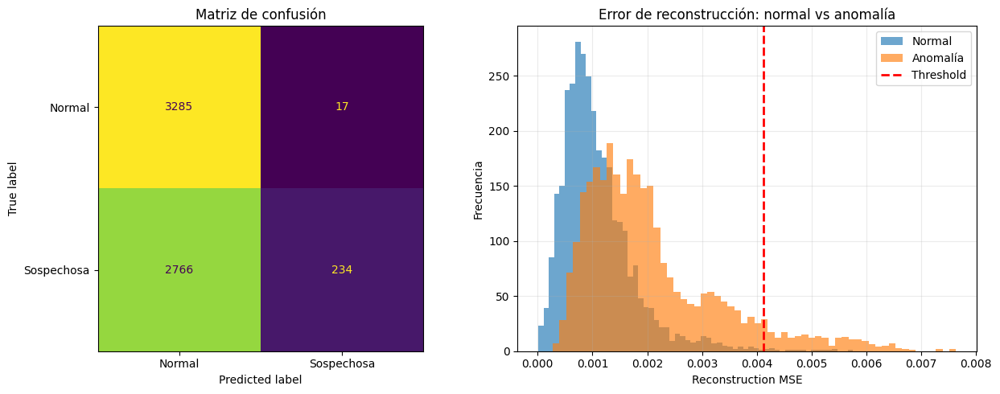

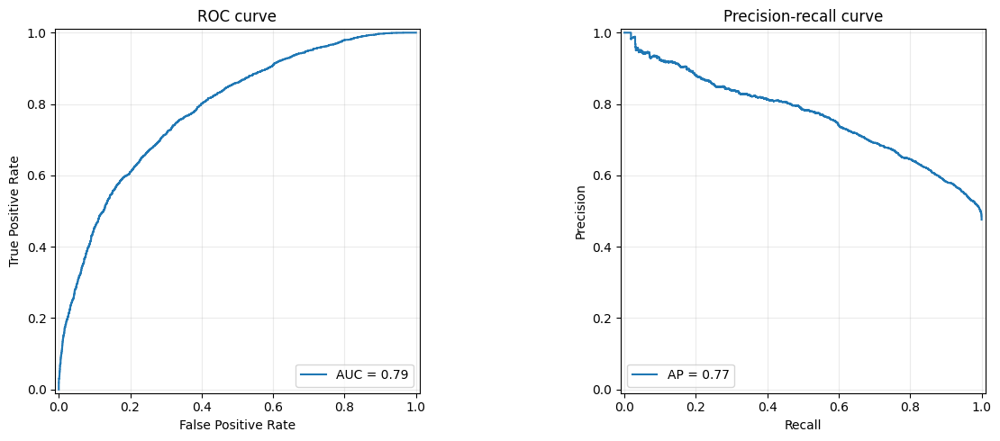

In [101]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

ConfusionMatrixDisplay(cm, display_labels=["Normal", "Sospechosa"]).plot(
    ax=axes[0],
    colorbar=False,
    values_format="d",
)
axes[0].set_title("Matriz de confusión")

normal_scores = df_test_all_errors.loc[df_test_all_errors["is_anomaly"] == 0, "reconstruction_mse"]
anomaly_scores = df_test_all_errors.loc[df_test_all_errors["is_anomaly"] == 1, "reconstruction_mse"]

axes[1].hist(normal_scores, bins=60, alpha=0.65, label="Normal")
if len(anomaly_scores):
    axes[1].hist(anomaly_scores, bins=60, alpha=0.65, label="Anomalía")
axes[1].axvline(ANOMALY_THRESHOLD, color="red", linestyle="--", linewidth=2, label="Threshold")
axes[1].set_title("Error de reconstrucción: normal vs anomalía")
axes[1].set_xlabel("Reconstruction MSE")
axes[1].set_ylabel("Frecuencia")
axes[1].legend()
axes[1].grid(alpha=0.25)

plt.tight_layout()
plt.show()

if has_two_classes:
    fig, axes = plt.subplots(1, 2, figsize=(13, 5))

    fpr, tpr, _ = roc_curve(y_true, y_score)
    RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=metrics_summary["roc_auc"]).plot(ax=axes[0])
    axes[0].set_title("ROC curve")
    axes[0].grid(alpha=0.25)

    precision_curve, recall_curve, _ = precision_recall_curve(y_true, y_score)
    PrecisionRecallDisplay(
        precision=precision_curve,
        recall=recall_curve,
        average_precision=metrics_summary["average_precision"],
    ).plot(ax=axes[1])
    axes[1].set_title("Precision-recall curve")
    axes[1].grid(alpha=0.25)

    plt.tight_layout()
    plt.show()
else:
    print("Curvas ROC y precision-recall pendientes hasta añadir positivos/anomalías.")

## Fase 12 — Visualización original / reconstrucción / mapa de error

La visualización cualitativa es clave para interpretar el comportamiento del autoencoder. El mapa de error muestra dónde la reconstrucción se aleja más de la imagen original.

En los **true positives**, esperamos ver desviaciones visuales que empujan el score por encima del umbral. En los **false positives**, una maleta normal puede ser visualmente inusual. En los **false negatives**, una anomalía puede parecerse al equipaje normal o ser reconstruida parcialmente.

### 12.1 Grupos de aciertos y errores

Creamos DataFrames auxiliares para analizar cada caso por separado.

In [102]:
df_true_positives = df_test_all_errors[
    (df_test_all_errors["is_anomaly"] == 1) & (df_test_all_errors["predicted_anomaly"] == 1)
].copy()

df_true_negatives = df_test_all_errors[
    (df_test_all_errors["is_anomaly"] == 0) & (df_test_all_errors["predicted_anomaly"] == 0)
].copy()

df_false_positives = df_test_all_errors[
    (df_test_all_errors["is_anomaly"] == 0) & (df_test_all_errors["predicted_anomaly"] == 1)
].copy()

df_false_negatives = df_test_all_errors[
    (df_test_all_errors["is_anomaly"] == 1) & (df_test_all_errors["predicted_anomaly"] == 0)
].copy()

case_counts = pd.DataFrame({
    "case": ["true_positives", "true_negatives", "false_positives", "false_negatives"],
    "num_images": [
        len(df_true_positives),
        len(df_true_negatives),
        len(df_false_positives),
        len(df_false_negatives),
    ],
})

display(case_counts)

,case,num_images
0,true_positives,234
1,true_negatives,3285
2,false_positives,17
3,false_negatives,2766


### 12.2 Función de visualización con mapa de error

Para cada imagen mostramos:

- original,
- reconstrucción,
- mapa de error absoluto agregado por canales,
- score MSE,
- etiqueta real,
- predicción del umbral.

In [103]:
def tensor_to_image(tensor: torch.Tensor) -> np.ndarray:
    image = tensor.detach().cpu().permute(1, 2, 0).numpy()
    return np.clip(image, 0, 1)


@torch.no_grad()
def visualize_reconstruction_with_error(
    model,
    df: pd.DataFrame,
    threshold: float,
    n: int = 6,
    device=device,
) -> None:
    if df.empty:
        print("No hay imágenes para visualizar en este grupo.")
        return

    sample_df = (
        df.sample(n=min(n, len(df)), random_state=RANDOM_STATE)
        .reset_index(drop=True)
    )

    temp_dataset = XrayAutoencoderDataset(sample_df, transform=autoencoder_transform)
    model.eval()

    rows = len(temp_dataset)
    fig, axes = plt.subplots(rows, 3, figsize=(12, 4 * rows))
    if rows == 1:
        axes = np.expand_dims(axes, axis=0)

    for idx in range(rows):
        original_tensor, _, metadata = temp_dataset[idx]
        original_batch = original_tensor.unsqueeze(0).to(device)
        reconstruction_tensor = model(original_batch).squeeze(0).cpu()

        error_tensor = torch.abs(original_tensor.cpu() - reconstruction_tensor)
        error_heatmap = error_tensor.mean(dim=0).numpy()
        reconstruction_mse = float(torch.mean((reconstruction_tensor - original_tensor.cpu()) ** 2).item())

        real_label = "Anomalía" if int(sample_df.loc[idx, "is_anomaly"]) == 1 else "Normal"
        predicted_label = "Sospechosa" if reconstruction_mse > threshold else "Normal"

        axes[idx, 0].imshow(tensor_to_image(original_tensor))
        axes[idx, 0].set_title(f"Original\n{metadata['sample_id']} | {metadata['view_id']}")
        axes[idx, 0].axis("off")

        axes[idx, 1].imshow(tensor_to_image(reconstruction_tensor))
        axes[idx, 1].set_title("Reconstrucción")
        axes[idx, 1].axis("off")

        heatmap = axes[idx, 2].imshow(error_heatmap, cmap="magma")
        axes[idx, 2].set_title(
            f"Mapa de error\nMSE={reconstruction_mse:.6f} | Real: {real_label} | Pred: {predicted_label}"
        )
        axes[idx, 2].axis("off")
        fig.colorbar(heatmap, ax=axes[idx, 2], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

### 12.3 True positives

Casos positivos que el umbral marca como sospechosos. Son ejemplos donde el error de reconstrucción actúa como señal útil de desviación visual.

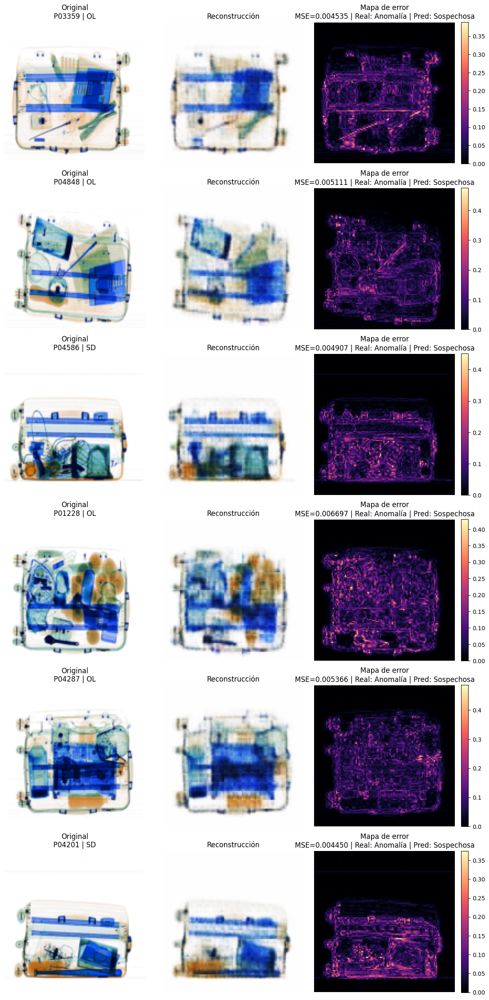

In [104]:
visualize_reconstruction_with_error(
    model,
    df_true_positives,
    threshold=ANOMALY_THRESHOLD,
    n=6,
    device=device,
)

### 12.4 True negatives

Casos normales correctamente marcados como normales. Ayudan a comprobar que el modelo reconstruye bien la distribución visual que aprendió durante entrenamiento.

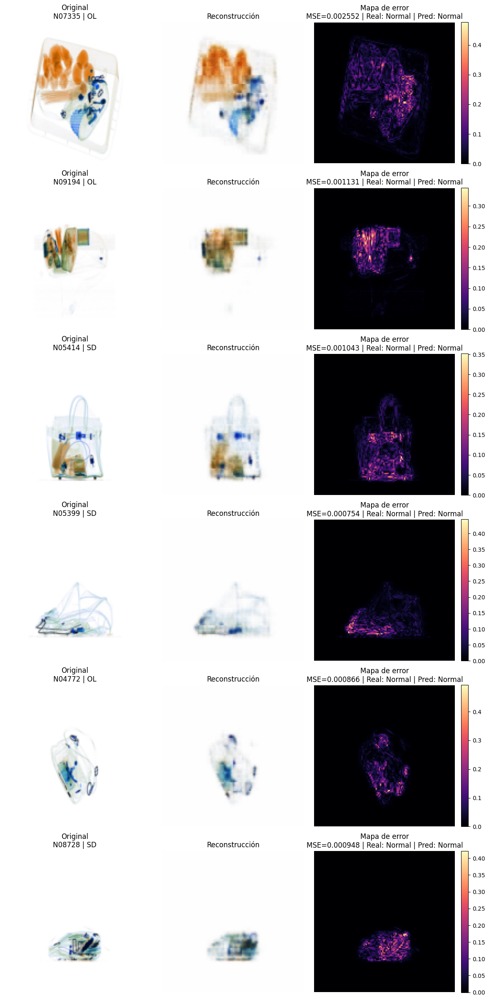

In [105]:
visualize_reconstruction_with_error(
    model,
    df_true_negatives,
    threshold=ANOMALY_THRESHOLD,
    n=6,
    device=device,
)

### 12.5 False positives

Normales marcados como sospechosos. Suelen ser importantes para calibrar el sistema: una imagen puede ser normal pero visualmente rara, densa o difícil de reconstruir.

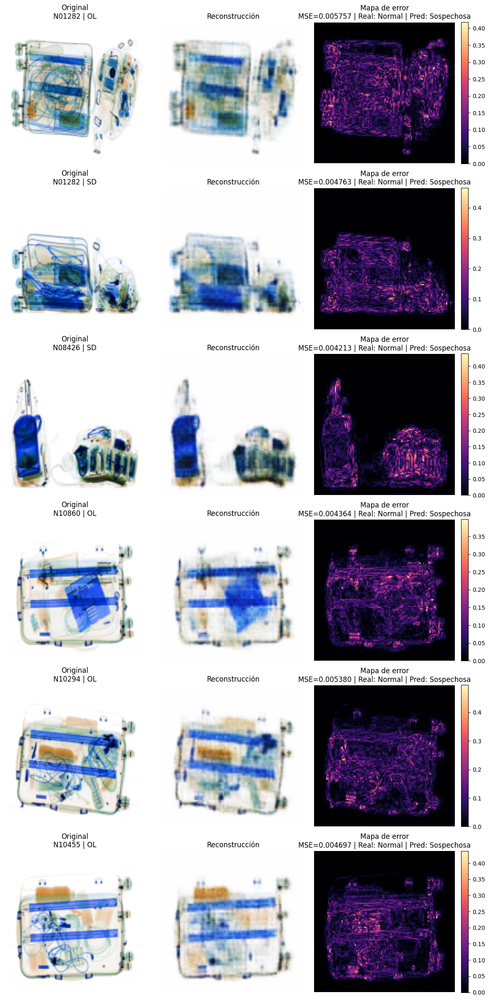

In [106]:
visualize_reconstruction_with_error(
    model,
    df_false_positives,
    threshold=ANOMALY_THRESHOLD,
    n=6,
    device=device,
)

### 12.6 False negatives

Anomalías marcadas como normales. Son los casos más delicados: pueden indicar que la anomalía se parece demasiado al equipaje normal o que el autoencoder consigue reconstruir parte de la señal anómala.

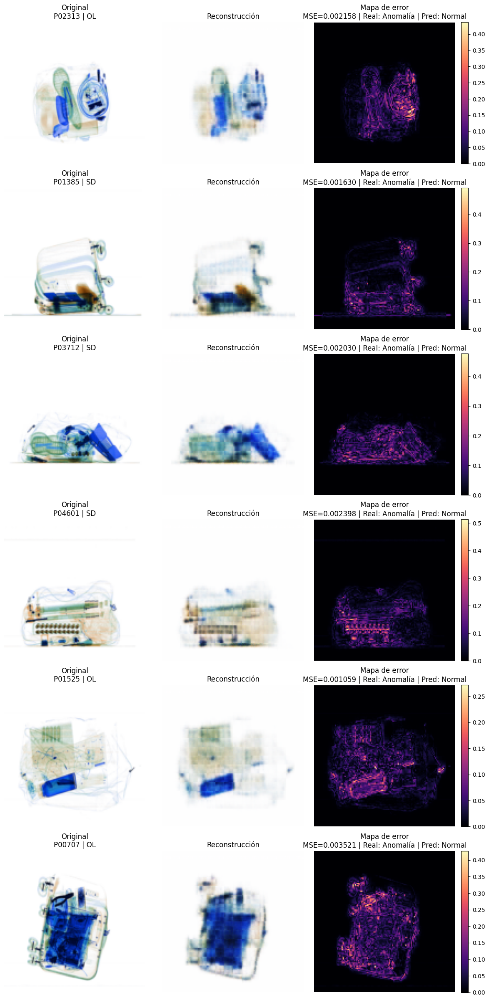

In [107]:
visualize_reconstruction_with_error(
    model,
    df_false_negatives,
    threshold=ANOMALY_THRESHOLD,
    n=6,
    device=device,
)

# 13. Análisis crítico y mejoras futuras

Esta sección cierra el notebook desde una perspectiva académica y profesional. El objetivo no es presentar el Autoencoder como una solución definitiva, sino analizar qué aporta, qué no puede resolver por sí solo y cómo podría evolucionar hacia un sistema más robusto de apoyo a la inspección.

## 13.1 Qué aprendió realmente el modelo

El Autoencoder convolucional entrenado en este notebook **no aprende objetos semánticos**. No sabe qué es una pistola, un cuchillo, una herramienta o cualquier otra categoría de amenaza. Su entrenamiento no le enseña conceptos de alto nivel ni relaciones causales entre objetos. Lo que aprende es una aproximación estadística de cómo suelen verse las imágenes normales del conjunto de entrenamiento.

Desde el punto de vista del modelo, una imagen normal es una combinación de patrones visuales frecuentes: formas, densidades, texturas, bordes, transparencias y distribuciones de intensidad propias del equipaje observado. El encoder comprime esa información en un espacio latente, y el decoder intenta reconstruir la imagen original a partir de esa representación comprimida.

Ese espacio latente puede interpretarse como una aproximación al **manifold de normalidad**: una región del espacio visual donde se concentran las muestras normales. Si una imagen se parece a las normales usadas durante entrenamiento, el modelo suele reconstruirla con menor error. Si se aleja de esa distribución, la reconstrucción tiende a ser peor y el **reconstruction error** aumenta.

Este enfoque se conoce como **reconstruction-based anomaly detection**. La hipótesis central es que un modelo entrenado solo con normalidad reconstruirá mejor lo normal que lo anómalo. Sin embargo, la reconstrucción es aproximada. Incluso imágenes normales pueden aparecer algo borrosas porque el cuello de botella obliga al modelo a comprimir información, perder detalles finos y priorizar estructuras visuales dominantes frente a pequeñas variaciones locales.

## 13.2 Fortalezas observadas

El proyecto demuestra que es posible construir un pipeline reproducible para modelar normalidad visual en imágenes de equipaje por rayos X. La separación estadística entre errores normales y anómalos, cuando aparece, permite definir un threshold razonable y convertir el error de reconstrucción en una señal operativa de sospecha.

Una fortaleza importante es que el método no depende de etiquetas exhaustivas de todas las amenazas posibles. Al aprender la distribución de equipaje normal, puede reaccionar ante configuraciones visualmente inusuales aunque no correspondan exactamente a una clase etiquetada durante el diseño del sistema.

Los mapas de error también aportan interpretabilidad. Aunque no explican semánticamente qué objeto hay en la imagen, sí permiten observar qué regiones contribuyen más al error de reconstrucción. Esto ayuda a presentar el resultado como una herramienta de priorización para revisión humana.

Además, el notebook queda organizado como una práctica modular: verificación del dataset, construcción de DataFrames, particiones sin fuga por `sample_id`, DataLoaders, entrenamiento, análisis de errores, threshold, métricas y visualizaciones. Esta estructura facilita reproducir el experimento y sustituir componentes en futuras iteraciones.

El sistema debe entenderse como **apoyo humano**, no como decisión automática final. Su valor está en ordenar o priorizar imágenes sospechosas, no en emitir una conclusión definitiva sobre seguridad.

## 13.3 Limitaciones reales del enfoque

La principal limitación es que el Autoencoder detecta **rareza estadística**, no amenaza real. Una imagen visualmente rara no implica necesariamente que exista un objeto peligroso. Del mismo modo, una amenaza real podría parecer estadísticamente normal si su forma, densidad o posición se integran bien en la distribución aprendida.

Los falsos positivos son esperables en equipajes complejos: maletas con muchos objetos superpuestos, alta densidad, formas poco frecuentes o contrastes inusuales pueden reconstruirse mal aunque sean normales. En un sistema real, esto puede saturar la revisión humana si el threshold no se calibra cuidadosamente.

También existen falsos negativos. Algunas anomalías sutiles pueden no generar suficiente error si son pequeñas, están parcialmente ocultas o se parecen visualmente a objetos cotidianos. Además, los Autoencoders pueden reconstruir parcialmente patrones anómalos, especialmente si tienen capacidad suficiente o si la anomalía comparte regularidades con el equipaje normal.

Otra limitación es la reconstrucción borrosa. El modelo tiende a capturar estructuras globales y puede perder detalles finos. Esto afecta tanto a la calidad visual de las reconstrucciones como a la sensibilidad del mapa de error.

El threshold es un punto crítico. Un umbral alto reduce falsos positivos, pero puede aumentar falsos negativos. Un umbral bajo detecta más anomalías, pero puede marcar demasiados normales como sospechosos. La elección del threshold debe depender del coste operacional de cada tipo de error.

También hay limitaciones computacionales y de datos. Entrenar a mayor resolución, usar modelos más profundos o evaluar grandes volúmenes de imágenes requiere GPU, memoria y tiempo. Además, la calidad del sistema depende de la diversidad del dataset normal. Si el conjunto de entrenamiento no representa bien distintos tipos de equipaje, escáneres, condiciones de captura o poblaciones de uso, el modelo puede aprender sesgos del dataset y generalizar peor.

En resumen: el modelo no comprende intención, peligrosidad ni contexto operativo. Detecta desviaciones visuales respecto a una distribución aprendida.

## 13.4 Comparación conceptual con detectores supervisados

### Detectores supervisados

Los detectores supervisados, como modelos de object detection, requieren etiquetas explícitas: bounding boxes, clases y ejemplos representativos de cada objeto. Su ventaja es que pueden identificar clases concretas y localizar objetos específicos cuando esos objetos aparecen de forma parecida a los datos de entrenamiento.

Su limitación es el carácter cerrado del problema: funcionan mejor con clases conocidas. Si aparece una amenaza modificada, un objeto no etiquetado o una configuración fuera del catálogo de clases, el detector puede no responder adecuadamente.

### Autoencoder anomaly detection

El enfoque con Autoencoder aprende normalidad visual. No necesita etiquetar cada amenaza posible y puede detectar configuraciones nunca vistas si producen una desviación suficiente en el error de reconstrucción.

Su desventaja es que resulta menos preciso semánticamente. Puede decir que algo no encaja bien con lo aprendido como normal, pero no identifica necesariamente qué es ni por qué sería peligroso.

Ambos enfoques son complementarios. Un sistema supervisado puede localizar objetos conocidos con precisión, mientras que un detector de anomalías puede actuar como capa adicional para priorizar casos extraños, abiertos o no cubiertos por las clases etiquetadas.

## 13.5 Posibles mejoras futuras

- **Variational Autoencoders (VAE):** permiten modelar explícitamente una distribución latente y pueden aportar una noción probabilística de normalidad.
- **GANomaly / Skip-GANomaly:** combinan reconstrucción y discriminadores adversariales para mejorar la separación entre normalidad y anomalía.
- **Vision Transformers:** pueden capturar dependencias globales de la imagen mejor que CNNs pequeñas, especialmente en escenas con objetos distribuidos o superpuestos.
- **Perceptual loss:** compara características extraídas por una red profunda, no solo píxeles, y puede penalizar diferencias visualmente relevantes.
- **SSIM loss:** mide similitud estructural y puede complementar el MSE cuando interesa preservar formas y contraste local.
- **Attention mechanisms:** ayudan al modelo a ponderar regiones importantes y podrían mejorar la sensibilidad a zonas pequeñas o densas.
- **Multi-scale reconstruction:** reconstruir a varias resoluciones permite combinar estructura global con detalles locales.
- **Anomaly segmentation:** en lugar de producir solo un score por imagen, puede estimar regiones anómalas con mayor precisión espacial.
- **Dual-view fusion:** DvXray contiene dos vistas por muestra; fusionarlas podría mejorar la robustez frente a oclusiones y ambigüedades de una sola perspectiva.
- **Temporal consistency:** en entornos con secuencias o múltiples capturas, comparar estabilidad entre frames o pasadas puede reducir falsas alarmas.
- **Ensemble methods:** combinar varios modelos o thresholds puede reducir dependencia de una única arquitectura.
- **Latent-space anomaly scoring:** además del error de reconstrucción, se puede medir rareza en el espacio latente mediante distancias, densidad o modelos probabilísticos.
- **Self-supervised learning:** tareas pretexto o modelos contrastivos pueden aprender representaciones visuales más ricas sin requerir etiquetas detalladas.
- **Industrial deployment considerations:** calibración por escáner, monitorización de drift, auditoría de falsos negativos, latencia, trazabilidad, privacidad, interfaz para operadores y protocolos claros de revisión humana.

## 13.6 Conclusión final

Este notebook demuestra cómo un Autoencoder convolucional puede modelar normalidad visual en imágenes de equipaje por rayos X y transformar el error de reconstrucción en una señal cuantitativa de sospecha.

La principal ventaja del enfoque es su utilidad en escenarios abiertos: no necesita conocer todas las amenazas posibles para detectar desviaciones visuales. Esto lo convierte en una línea base sólida para priorización, análisis exploratorio y sistemas de apoyo a la inspección.

Sin embargo, el método no reemplaza a operadores humanos ni a modelos supervisados especializados. No identifica objetos, no razona sobre intención y no garantiza que toda amenaza produzca un error alto. Su salida debe interpretarse como una señal probabilística y operacional, no como una decisión definitiva.

La incorporación de heatmaps aporta una capa de interpretabilidad práctica: permite observar dónde falla la reconstrucción y facilita que una persona revise con más contexto. En un sistema realista, esta combinación de score, visualización y revisión humana es más responsable que automatizar decisiones críticas sin supervisión.

Como práctica académica, el proyecto cubre el ciclo completo de una baseline profesional de anomaly detection: preparación de datos, entrenamiento con normalidad, análisis de error, calibración de threshold, evaluación y discusión crítica de limitaciones. El siguiente salto natural sería comparar este baseline con modelos más avanzados, incorporar fusión dual-view y validar el comportamiento en datasets más diversos.